In [15]:
!git clone https://github.com/jantic/DeOldify.git DeOldify 

Cloning into 'DeOldify'...
remote: Enumerating objects: 2344, done.
remote: Counting objects: 100% (116/116), done.
remote: Compressing objects: 100% (107/107), done.
remote: Total 2344 (delta 57), reused 29 (delta 9), pack-reused 2228
Receiving objects: 100% (2344/2344), 69.46 MiB | 29.38 MiB/s, done.
Resolving deltas: 100% (1065/1065), done.


## Trying to work with Deoldify

In [16]:
%cd DeOldify

/kaggle/working/DeOldify/DeOldify


In [17]:
#NOTE:  This must be the first call in order to work properly!
from deoldify import device
from deoldify.device_id import DeviceId
#choices:  CPU, GPU0...GPU7
device.set(device=DeviceId.GPU0)

import torch

if not torch.cuda.is_available():
    print('GPU not available.')

In [18]:
!cat 'colab_requirements.txt'

fastai==1.0.51
tensorboardX==1.6
ffmpeg-python
youtube-dl>=2019.4.17
opencv-python>=3.3.0.10
pillow
tornado~=5.1.0


In [19]:
!pip install -r ./colab_requirements.txt

In [20]:
import fastai
from deoldify.visualize import *

torch.backends.cudnn.benchmark = True

In [21]:
!mkdir 'models'
!wget https://www.dropbox.com/s/usf7uifrctqw9rl/ColorizeStable_gen.pth?dl=0 -O ./models/ColorizeStable_gen.pth

--2022-03-12 06:32:35--  https://www.dropbox.com/s/usf7uifrctqw9rl/ColorizeStable_gen.pth?dl=0
Resolving www.dropbox.com (www.dropbox.com)... 162.125.9.18, 2620:100:601f:18::a27d:912
Connecting to www.dropbox.com (www.dropbox.com)|162.125.9.18|:443... connected.
HTTP request sent, awaiting response... 301 Moved Permanently
Location: /s/raw/usf7uifrctqw9rl/ColorizeStable_gen.pth [following]
--2022-03-12 06:32:35--  https://www.dropbox.com/s/raw/usf7uifrctqw9rl/ColorizeStable_gen.pth
Reusing existing connection to www.dropbox.com:443.
HTTP request sent, awaiting response... 302 Found
Location: https://uc918412b85cff2ae13a26e9ea9c.dl.dropboxusercontent.com/cd/0/inline/BhTX4f-XBKzNUeMBMwtv5YPH7oCCLth_2CcXNKsxQdbnOB6lgBb-3h36KYAG5dgVysZ0C7ATsvxSmuF8pks7QVkPcW3xbkL3USjmnpaQeC1PKl3EPSizNvTD9xVEQ5HPaqV4OahkM2ansfa4J4jnwYva2C7rhNZfXB239WdGm6GeeQ/file# [following]
--2022-03-12 06:32:35--  https://uc918412b85cff2ae13a26e9ea9c.dl.dropboxusercontent.com/cd/0/inline/BhTX4f-XBKzNUeMBMwtv5YPH7oCCLth_2

In [22]:
!wget https://media.githubusercontent.com/media/jantic/DeOldify/master/resource_images/watermark.png -O ./resource_images/watermark.png

--2022-03-12 06:32:57--  https://media.githubusercontent.com/media/jantic/DeOldify/master/resource_images/watermark.png
Resolving media.githubusercontent.com (media.githubusercontent.com)... 185.199.111.133, 185.199.109.133, 185.199.108.133, ...
Connecting to media.githubusercontent.com (media.githubusercontent.com)|185.199.111.133|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 9210 (9.0K) [image/png]
Saving to: ‘./resource_images/watermark.png’

./resource_images/w 100%[===================>]   8.99K  --.-KB/s    in 0s      

2022-03-12 06:32:57 (57.0 MB/s) - ‘./resource_images/watermark.png’ saved [9210/9210]



In [23]:
colorizer_non = get_image_colorizer(artistic=False)

In [24]:
!wget "https://github.com/fanbyprinciple/kaggle_kernels/raw/master/IMG-20220312-WA0012.jpg" -O output.jpg

--2022-03-12 06:33:13--  https://github.com/fanbyprinciple/kaggle_kernels/raw/master/IMG-20220312-WA0012.jpg
Resolving github.com (github.com)... 140.82.112.3
Connecting to github.com (github.com)|140.82.112.3|:443... connected.
HTTP request sent, awaiting response... 302 Found
Location: https://raw.githubusercontent.com/fanbyprinciple/kaggle_kernels/master/IMG-20220312-WA0012.jpg [following]
--2022-03-12 06:33:13--  https://raw.githubusercontent.com/fanbyprinciple/kaggle_kernels/master/IMG-20220312-WA0012.jpg
Resolving raw.githubusercontent.com (raw.githubusercontent.com)... 185.199.110.133, 185.199.109.133, 185.199.111.133, ...
Connecting to raw.githubusercontent.com (raw.githubusercontent.com)|185.199.110.133|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 89066 (87K) [image/jpeg]
Saving to: ‘output.jpg’

output.jpg          100%[===================>]  86.98K  --.-KB/s    in 0.009s  

2022-03-12 06:33:13 (9.07 MB/s) - ‘output.jpg’ saved [89066/89066]



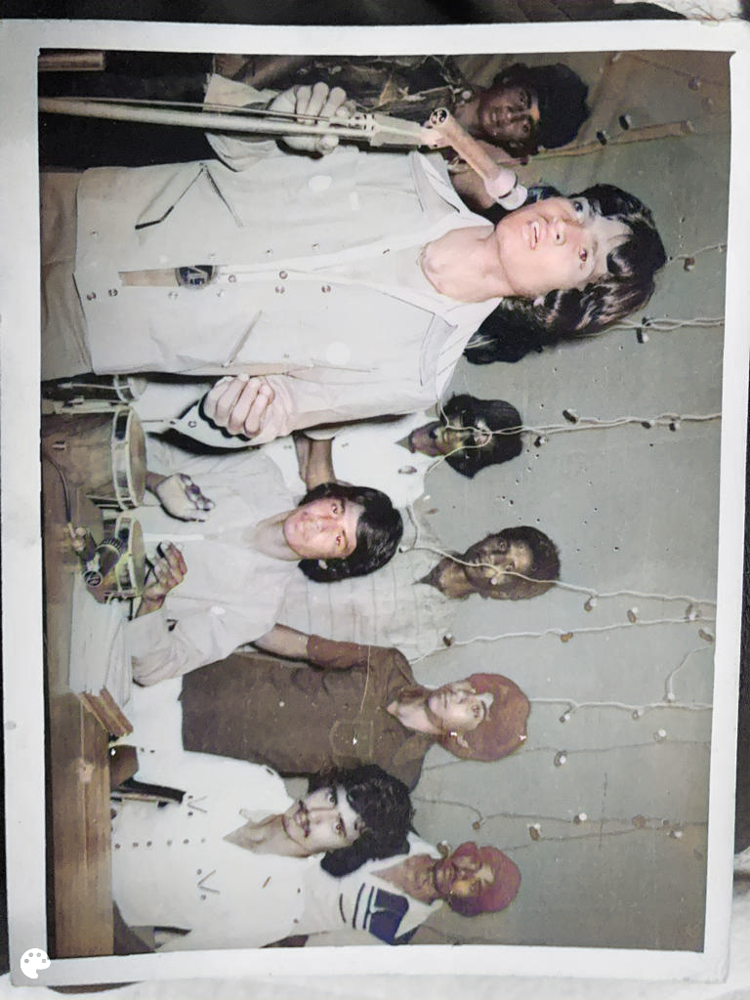

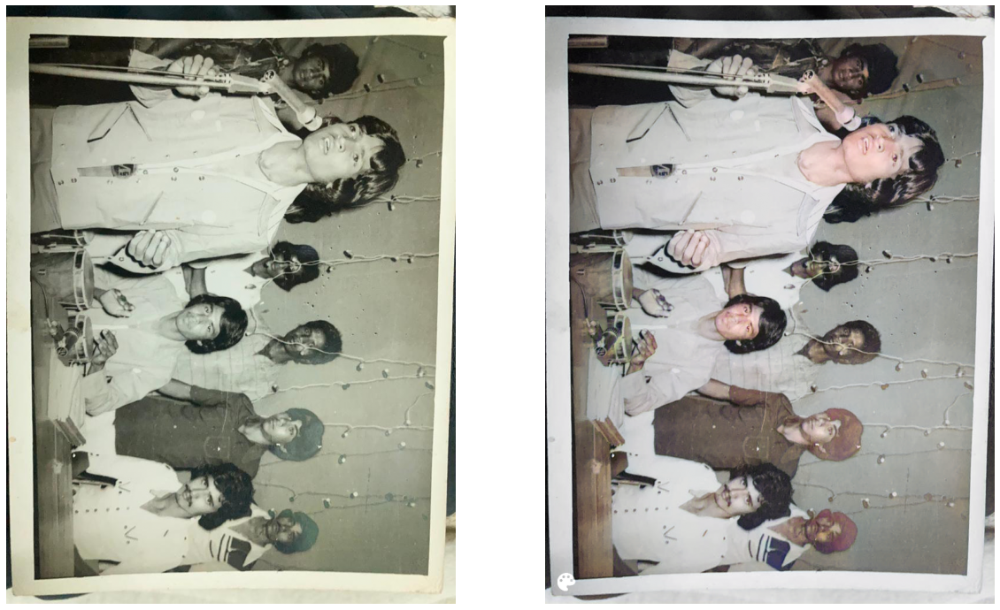

In [25]:
source_url = 'https://github.com/fanbyprinciple/kaggle_kernels/raw/master/IMG-20220312-WA0012.jpg'
render_factor = 35  #@param {type: "slider", min: 7, max: 40}
watermarked = True #@param {type:"boolean"}

if source_url is not None and source_url !='':
    image_path = colorizer_non.plot_transformed_image_from_url(url=source_url, render_factor=render_factor, compare=True, watermarked=watermarked)
    show_image_in_notebook(image_path)
else:
    print('Provide an image url and try again.')

In [26]:
print(image_path)

result_images/image.png


In [27]:
from IPython.display import FileLink
FileLink(r'result_images/image.png')

/kaggle/working/DeOldify/DeOldify/result_images/image.png

In [28]:
!pwd

/kaggle/working/DeOldify/DeOldify


In [29]:
!ls 

ColorFIDBenchmarkArtistic.ipynb		app_utils.py
ColorizeTrainingArtistic.ipynb		colab_requirements.txt
ColorizeTrainingStable.ipynb		deoldify
ColorizeTrainingStableLargeBatch.ipynb	dummy
ColorizeTrainingVideo.ipynb		environment.yml
ColorizeTrainingWandb.ipynb		fid
Dockerfile				models
Dockerfile-api				output.jpg
ImageColorizer.ipynb			quick_start.sh
ImageColorizerArtisticTests.ipynb	requirements-dev.txt
ImageColorizerColab.ipynb		requirements.txt
ImageColorizerColabStable.ipynb		resource_images
ImageColorizerStableTests.ipynb		result_images
LICENSE					run_image_api.sh
MANIFEST.in				run_notebook.sh
README.md				run_video_api.sh
VideoColorizer.ipynb			set_password.py
VideoColorizerColab.ipynb		setup.py
api_cmd_example.sh			test_images
app-video.py				tox.ini
app.py


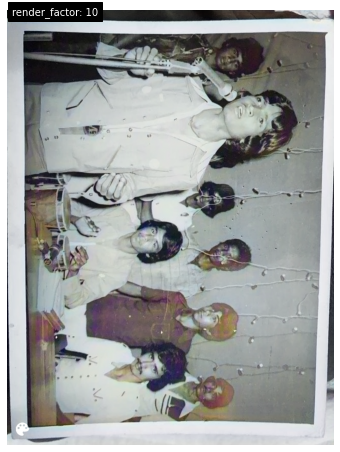

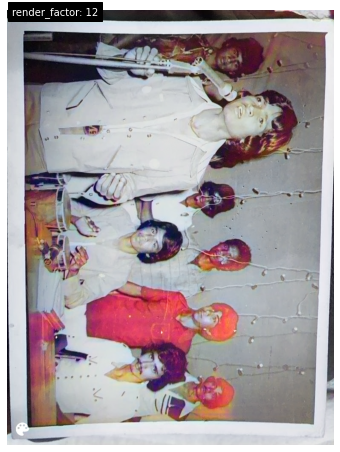

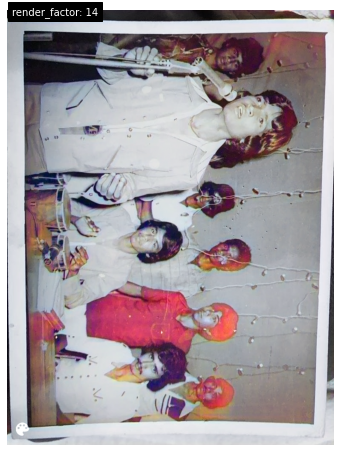

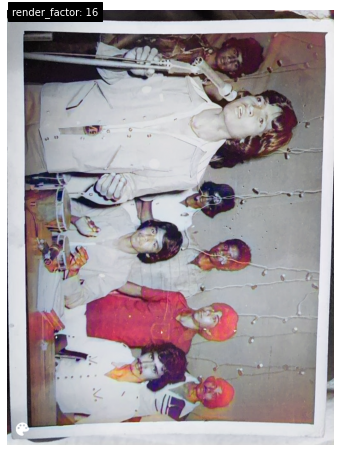

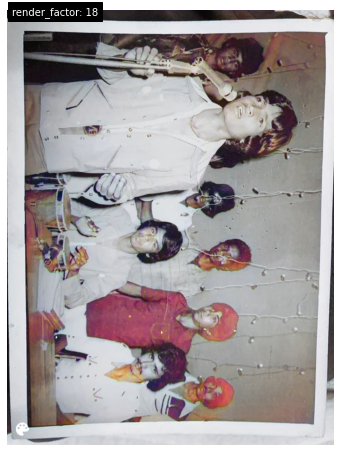

...

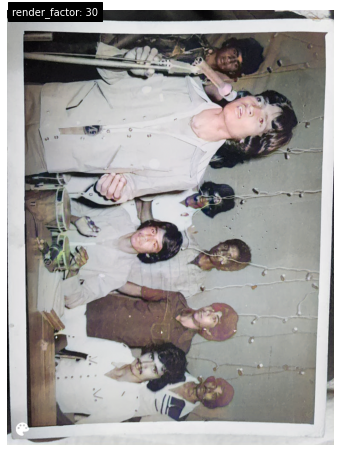

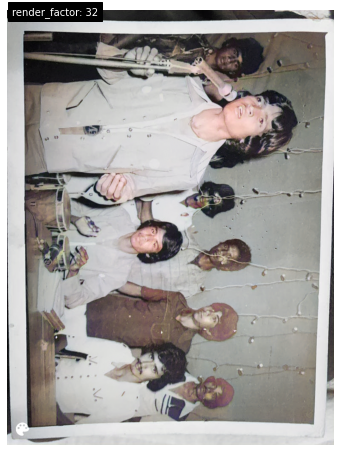

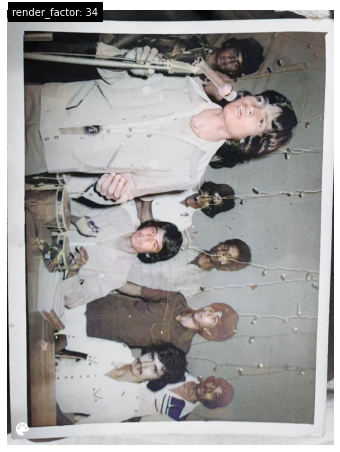

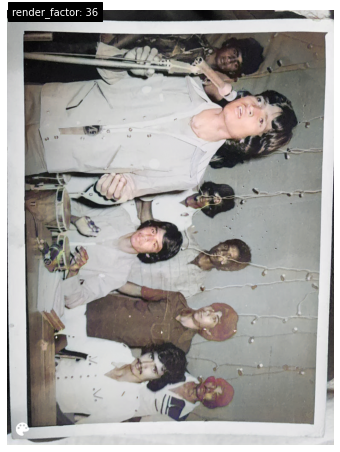

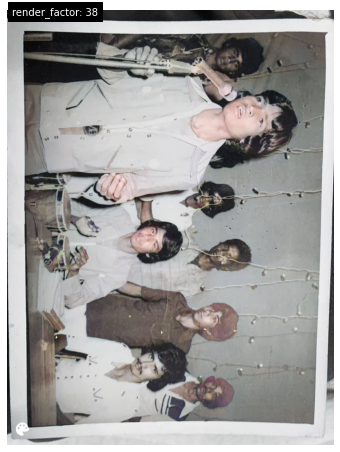

In [30]:
for i in range(10,40,2):
    colorizer_non.plot_transformed_image('output.jpg', render_factor=i, display_render_factor=True, figsize=(8,8))

# Lets try artisitic deoldify

In [31]:
!mkdir 'models'
!wget https://data.deepai.org/deoldify/ColorizeArtistic_gen.pth -O ./models/ColorizeArtistic_gen.pth

mkdir: cannot create directory ‘models’: File exists
--2022-03-12 06:34:01--  https://data.deepai.org/deoldify/ColorizeArtistic_gen.pth
Resolving data.deepai.org (data.deepai.org)... 138.201.36.183
Connecting to data.deepai.org (data.deepai.org)|138.201.36.183|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 255144681 (243M) [application/octet-stream]
Saving to: ‘./models/ColorizeArtistic_gen.pth’

./models/ColorizeAr 100%[===================>] 243.32M  20.8MB/s    in 13s     

2022-03-12 06:34:14 (19.4 MB/s) - ‘./models/ColorizeArtistic_gen.pth’ saved [255144681/255144681]



In [32]:
!wget https://media.githubusercontent.com/media/jantic/DeOldify/master/resource_images/watermark.png -O ./resource_images/watermark.png

--2022-03-12 06:34:15--  https://media.githubusercontent.com/media/jantic/DeOldify/master/resource_images/watermark.png
Resolving media.githubusercontent.com (media.githubusercontent.com)... 185.199.108.133, 185.199.110.133, 185.199.111.133, ...
Connecting to media.githubusercontent.com (media.githubusercontent.com)|185.199.108.133|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 9210 (9.0K) [image/png]
Saving to: ‘./resource_images/watermark.png’

./resource_images/w 100%[===================>]   8.99K  --.-KB/s    in 0s      

2022-03-12 06:34:15 (57.2 MB/s) - ‘./resource_images/watermark.png’ saved [9210/9210]



In [33]:
colorizer = get_image_colorizer(artistic=True)

Downloading: "https://download.pytorch.org/models/resnet34-b627a593.pth" to /root/.cache/torch/hub/checkpoints/resnet34-b627a593.pth


  0%|          | 0.00/83.3M [00:00<?, ?B/s]

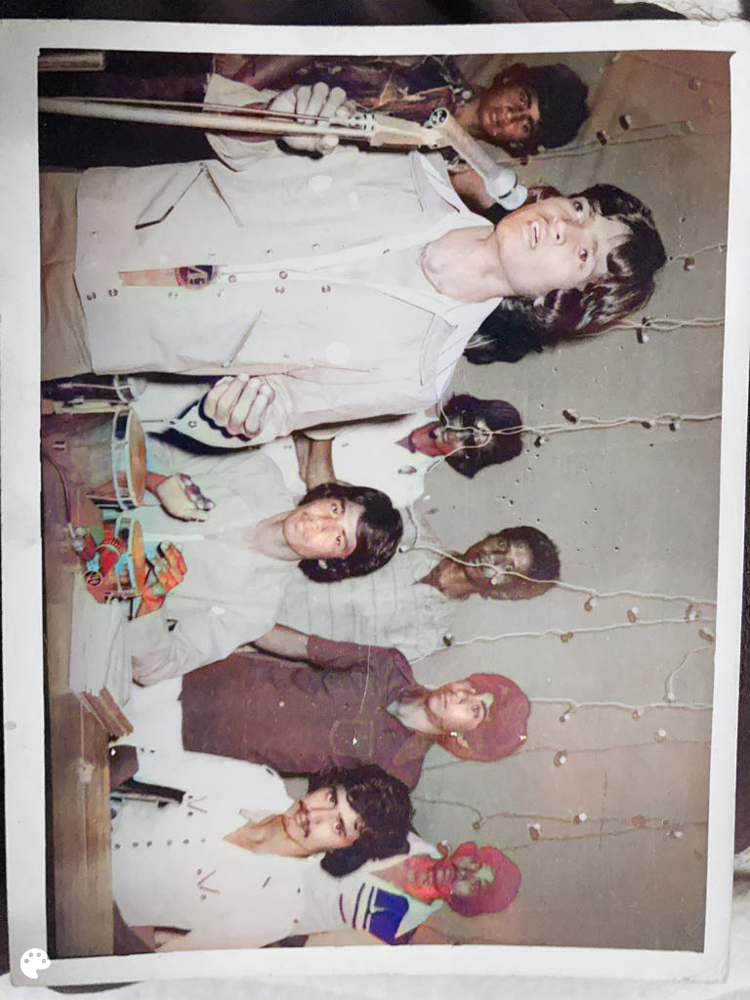

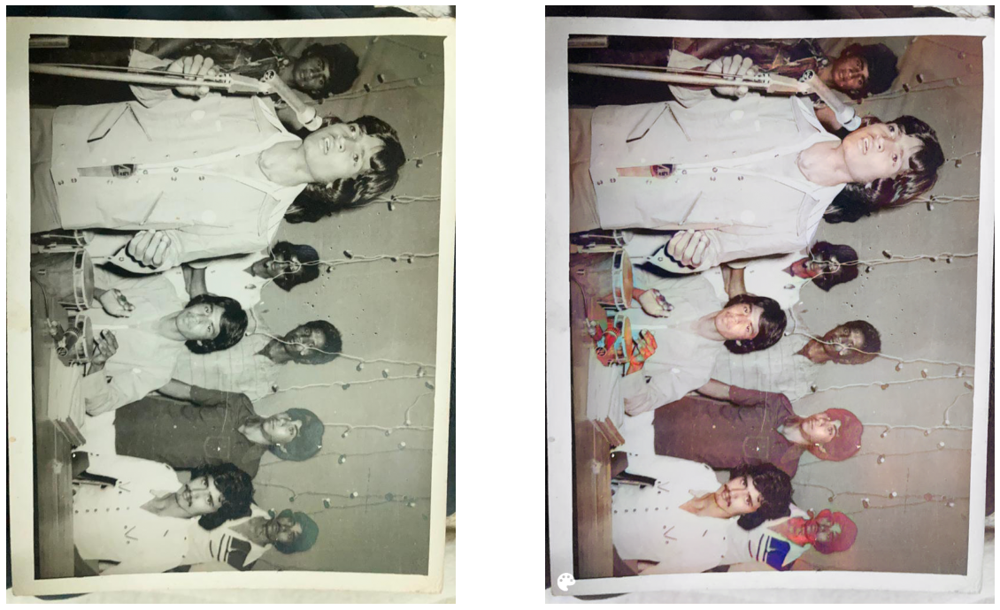

In [34]:
source_url = 'https://github.com/fanbyprinciple/kaggle_kernels/raw/master/IMG-20220312-WA0012.jpg'
render_factor = 35  #@param {type: "slider", min: 7, max: 40}
watermarked = True #@param {type:"boolean"}

if source_url is not None and source_url !='':
    image_path = colorizer.plot_transformed_image_from_url(url=source_url, render_factor=render_factor, compare=True, watermarked=watermarked)
    show_image_in_notebook(image_path)
else:
    print('Provide an image url and try again.')

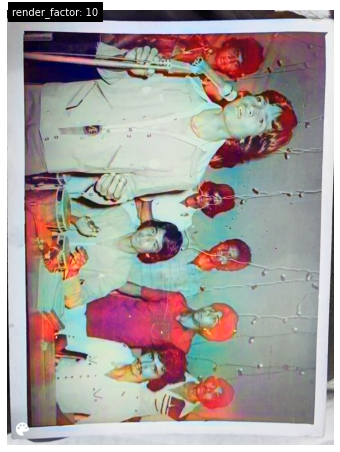

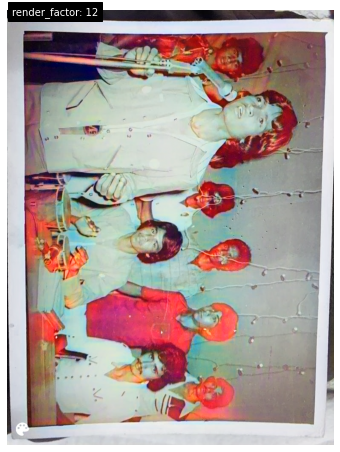

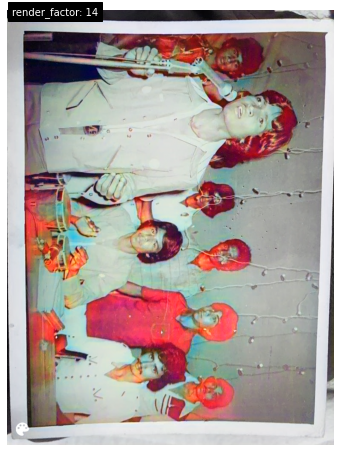

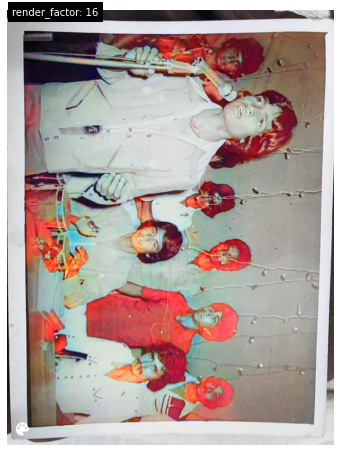

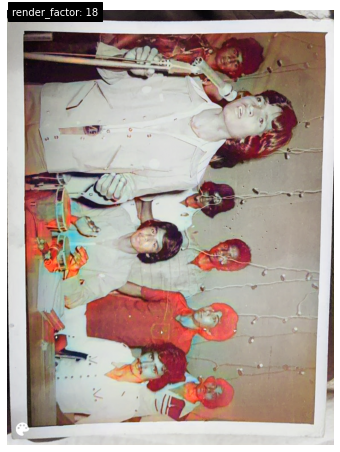

...

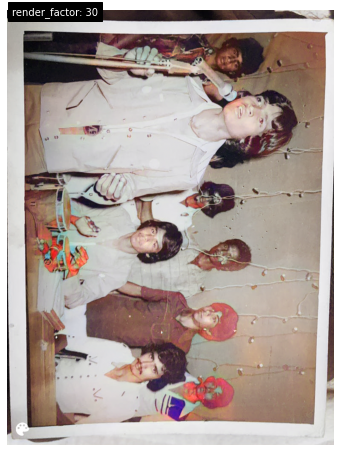

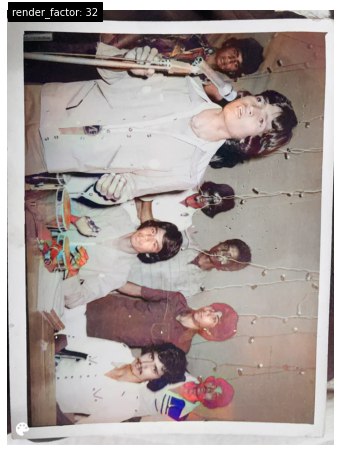

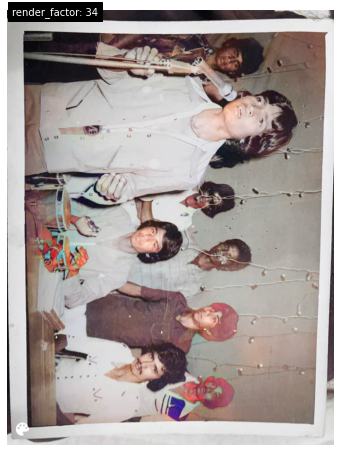

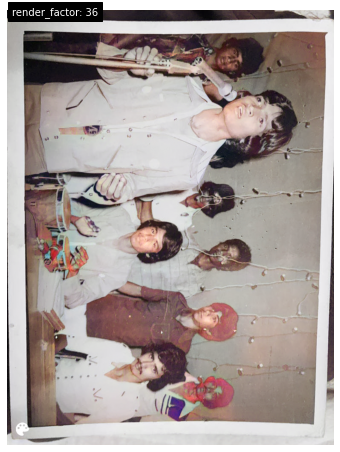

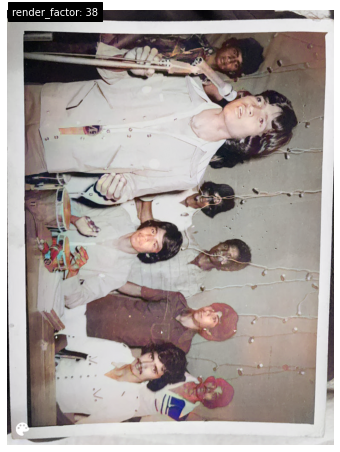

In [35]:
for i in range(10,40,2):
    colorizer.plot_transformed_image('output.jpg', render_factor=i, display_render_factor=True, figsize=(8,8))